In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!JAX_ENABLE_X64=True

'JAX_ENABLE_X64' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
from pathlib import Path
import pandas as pd
import numpy as np

import jax
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp
from jax import grad, hessian
from scipy import optimize

import pymc as pm
from pymc.gp import Latent
from pymc.gp.cov import Periodic, ExpQuad, RatQuad, WhiteNoise
import numpyro
numpyro.set_host_device_count(4)

import matplotlib.pyplot as plt
from tueplots import bundles
from tueplots.constants.color import rgb
plt.rcParams.update(bundles.beamer_moml())
plt.rcParams.update({'figure.dpi': 300})
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

from utils import gp, Gaussian, plotting
from utils.bayes.media_transforms import adstock, shape

d:\MattReda\miniforge\envs\pv_pitch_work\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
digital_data_test = pd.read_csv("Test_Digital.csv", index_col=0)[['days_to_release', "movie", "media", "Spend (USD)", "IndexedQueryVolume (IQV)"]]
original_list = pd.read_csv("original_list_clean.csv")[['days_to_release', 'movie', 'media', 'Spend (USD)', "IndexedQueryVolume (IQV)"]]

In [5]:
original_list.head()

,days_to_release,movie,media,Spend (USD),IndexedQueryVolume (IQV)
0,-60,The Man from Toronto,Instagram,0.0,0.00089
1,-59,The Man from Toronto,Instagram,0.0,0.00091
2,-58,The Man from Toronto,Instagram,0.0,0.00085
3,-57,The Man from Toronto,Instagram,0.0,0.00059
4,-56,The Man from Toronto,Instagram,0.0,0.00030


In [6]:
digital_data_test.head()

,days_to_release,movie,media,Spend (USD),IndexedQueryVolume (IQV)
0,-60,Maestro,Facebook,0.0,0.02347
1,-59,Maestro,Facebook,0.0,0.02541
2,-58,Maestro,Facebook,0.0,0.02481
3,-57,Maestro,Facebook,0.0,0.02443
4,-56,Maestro,Facebook,0.0,0.02536


In [7]:
full_data = pd.concat([digital_data_test, original_list])

In [8]:
full_data.media.unique()

array(['Facebook', 'Instagram', 'OTT', 'Desktop Display',
       'Mobile Display', 'YouTube', 'Desktop Video', 'TikTok',
       'X (formerly Twitter)', 'Snapchat', 'Mobile Video'], dtype=object)

In [9]:
DEVICE_TO_MEDIA_MAP = {
    "Facebook": "Social",
    "Instagram": "Social",
    "OTT": "OTT",
    "Desktop Display": "Display",
    "Mobile Display": "Display",
    "YouTube": "OLV",
    "Desktop Video": "OLV",
    "TikTok": "Social",
    "X (formerly Twitter)": "Social",
    "Snapchat": "Social"
}

In [10]:
full_data['MediaChannel'] = full_data['media'].apply(lambda x: DEVICE_TO_MEDIA_MAP.get(x,x))
full_data.head() 

,days_to_release,movie,media,Spend (USD),IndexedQueryVolume (IQV),MediaChannel
0,-60,Maestro,Facebook,0.0,0.02347,Social
1,-59,Maestro,Facebook,0.0,0.02541,Social
2,-58,Maestro,Facebook,0.0,0.02481,Social
3,-57,Maestro,Facebook,0.0,0.02443,Social
4,-56,Maestro,Facebook,0.0,0.02536,Social


In [11]:
full_data.columns

Index(['days_to_release', 'movie', 'media', 'Spend (USD)',
       'IndexedQueryVolume (IQV)', 'MediaChannel'],
      dtype='object')

In [12]:
digital_data_clean = full_data[['Spend (USD)', "days_to_release", "MediaChannel", "IndexedQueryVolume (IQV)", "movie"]]
digital_data_clean

,Spend (USD),days_to_release,MediaChannel,IndexedQueryVolume (IQV),movie
0,0.0,-60,Social,0.02347,Maestro
1,0.0,-59,Social,0.02541,Maestro
2,0.0,-58,Social,0.02481,Maestro
3,0.0,-57,Social,0.02443,Maestro
4,0.0,-56,Social,0.02536,Maestro
...,...,...,...,...,...
6045,0.0,56,OLV,0.02722,The Gray Man
6046,0.0,57,OLV,0.03350,The Gray Man
6047,0.0,58,OLV,0.02921,The Gray Man
6048,0.0,59,OLV,0.01815,The Gray Man


In [13]:
digital_data_clean.movie.value_counts()

movie
Maestro                                        1210
The Mill                                       1210
Red Notice                                     1210
Me Time                                        1210
Ghosted                                        1210
The Man from Toronto                           1210
No One Will Save You                           1210
Cassandro                                      1210
Good Grief                                     1210
Chicken Run: Dawn of the Nugget                1210
Diary of a Wimpy Kid Christmas: Cabin Fever    1210
Best. Christmas. Ever!                         1210
Quiz Lady                                      1210
Family Switch                                  1210
Dashing Through the Snow                       1210
Leave the World Behind                         1210
Spy Kids: Armageddon                           1210
Pain Hustlers                                  1210
Love at First Sight                            1210
Rebel 

In [14]:
DAYS_TO_RELEASE = np.arange(61) - 30
MEDIA_VARS = [
    "Social",
    "OLV",
    "Display",
    "OTT",
   # "Offline"
]
MOVIES = [
    #'A Million Miles Away', 
    #'Appendage', 
    #'Bad Santa',
    #'Best. Christmas. Ever!', 
    #'Candy Cane Lane', 
    #'Cassandro',
    #'Central Intelligence', 
    #'Chicken Run: Dawn of the Nugget',
    #'Christmas Chronicles', 
    #'Christmas Chronicles 1',
    #'Christmas Chronicles 2', 
    'Dashing Through the Snow',
    'Diary of a Wimpy Kid Christmas: Cabin Fever', 
    #'Die Hard',
    'Fair Play', 
    #'Family Man', 
    'Family Switch', 
    #'Fatman',
    #'Fingernails', 
    #'Flora and Son', 
    #'Foe', 
    'Ghosted', 
    'Good Grief',
    'The Gray Man', 
    #'Guardians of the Galaxy', 
    #'Guardians of the Galaxy 1',
    #'Guardians of the Galaxy 2', 
    #'Guardians of the Galaxy 3',
    #'Hit Man', 
    #'Jingle All the Way', 
    #'Jumanji: The Next Level',
    #'Jumanji: Welcome to the Jungle', 
    #'Klaus',
    'Leave the World Behind', 
    #'Leo', 
    'Love at First Sight', 
    #'Maestro',
    'The Man from Toronto', 
    'May December', 
    'Me Time',
    #'No One Will Save You', 
    #'Nyad', 
    'Old Dads', 
    'Pain Hustlers',
    'Quiz Lady', 
    'Rebel Moon', 
    'Red Notice', 
    'Reptile', 
    'Rustin',
    #'Sitting in Bars with Cake', 
    'Spy Kids: Armageddon', 
    #'The Burial',
    #'The Citadel', 
    #'The Claus Family', 
    #'The Claus Family 1',
    #'The Claus Family 2', 
    #'The Claus Family 3', 
    #'The Family Plan',
    #'The Killer', 
    #'The Last Boyscout', 
    'The Marvels', 
    #'The Mill',
    #'Thunderforce', 
    #'Totally Killer', 
    #'Wish'
]

In [15]:
from itertools import product

In [16]:
cleaned_inputs = digital_data_clean[['Spend (USD)', "days_to_release", "MediaChannel", "IndexedQueryVolume (IQV)", "movie"]].rename(columns={"movie": "title",
                                                                                                                                             "MediaChannel": "media_channel", 
                                                                                                                                             "Spend (USD)": "spend",
                                                                                                                                             "IndexedQueryVolume (IQV)": "iqv"})
cleaned_inputs.head()

,spend,days_to_release,media_channel,iqv,title
0,0.0,-60,Social,0.02347,Maestro
1,0.0,-59,Social,0.02541,Maestro
2,0.0,-58,Social,0.02481,Maestro
3,0.0,-57,Social,0.02443,Maestro
4,0.0,-56,Social,0.02536,Maestro


In [17]:
cleaned_inputs.title.value_counts()

title
Maestro                                        1210
The Mill                                       1210
Red Notice                                     1210
Me Time                                        1210
Ghosted                                        1210
The Man from Toronto                           1210
No One Will Save You                           1210
Cassandro                                      1210
Good Grief                                     1210
Chicken Run: Dawn of the Nugget                1210
Diary of a Wimpy Kid Christmas: Cabin Fever    1210
Best. Christmas. Ever!                         1210
Quiz Lady                                      1210
Family Switch                                  1210
Dashing Through the Snow                       1210
Leave the World Behind                         1210
Spy Kids: Armageddon                           1210
Pain Hustlers                                  1210
Love at First Sight                            1210
Rebel 

In [18]:
def non_zero_mean(arr):
    arr = np.array(arr)
    non_zero_arr = arr[arr>0]
    if len(non_zero_arr)==0:
        return 1
    return np.mean(non_zero_arr)

In [19]:
mean_spend_by_movie_by_channel = cleaned_inputs.groupby(['title', 'media_channel'])[['spend']].agg(non_zero_mean).reset_index().rename(columns={"spend": "mean_spend"})

In [20]:
mean_spend_by_movie_by_channel

,title,media_channel,mean_spend
0,Best. Christmas. Ever!,Display,1.000000
1,Best. Christmas. Ever!,OLV,2441.258019
2,Best. Christmas. Ever!,OTT,997.410024
3,Best. Christmas. Ever!,Social,3095.498763
4,Cassandro,Display,1.000000
...,...,...,...
112,The Marvels,Social,7796.202755
113,The Mill,Display,2709.390280
114,The Mill,OLV,5705.528605
115,The Mill,OTT,8063.136982


In [21]:
cleaned_inputs_with_mean = cleaned_inputs.merge(mean_spend_by_movie_by_channel, how='left', left_on=['title', 'media_channel'], right_on=['title', 'media_channel'])
cleaned_inputs_with_mean.head()

,spend,days_to_release,media_channel,iqv,title,mean_spend
0,0.0,-60,Social,0.02347,Maestro,11376.545212
1,0.0,-59,Social,0.02541,Maestro,11376.545212
2,0.0,-58,Social,0.02481,Maestro,11376.545212
3,0.0,-57,Social,0.02443,Maestro,11376.545212
4,0.0,-56,Social,0.02536,Maestro,11376.545212


In [22]:
normalized_inputs = cleaned_inputs_with_mean.copy()
normalized_inputs = normalized_inputs.assign(normalized_spend = lambda x: x.spend/x.mean_spend)

In [68]:
normalized_inputs['normalized_spend'].max()

14.988800074129555

C:\Users\matthew_reda\AppData\Local\Temp\2\ipykernel_6700\1622033694.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


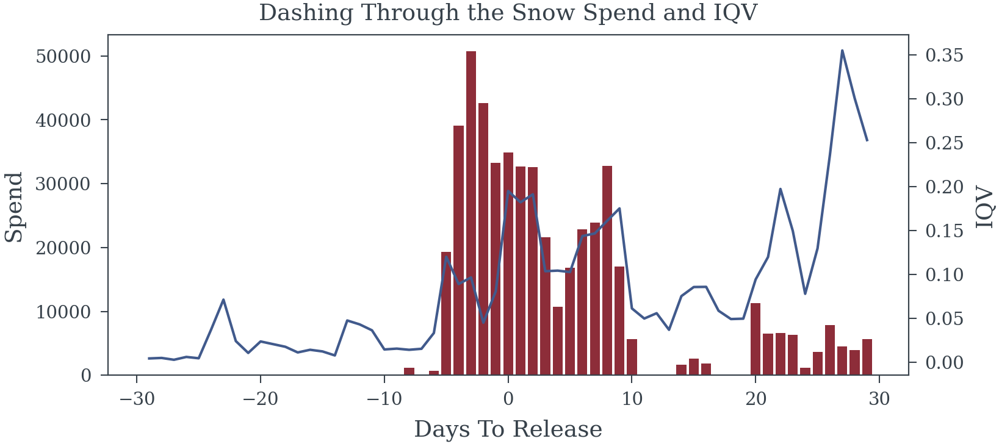

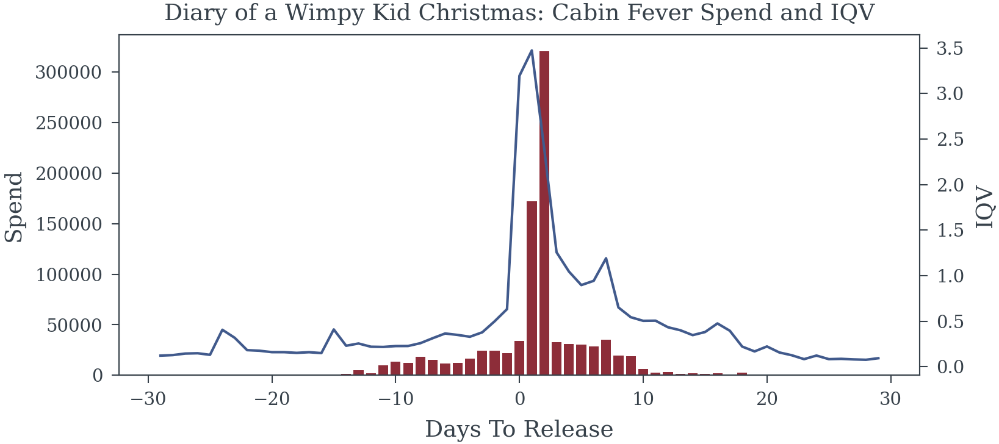

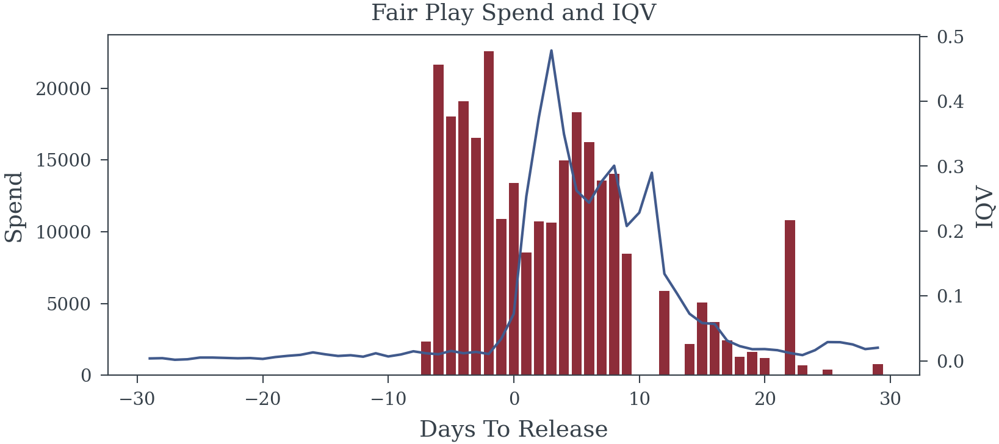

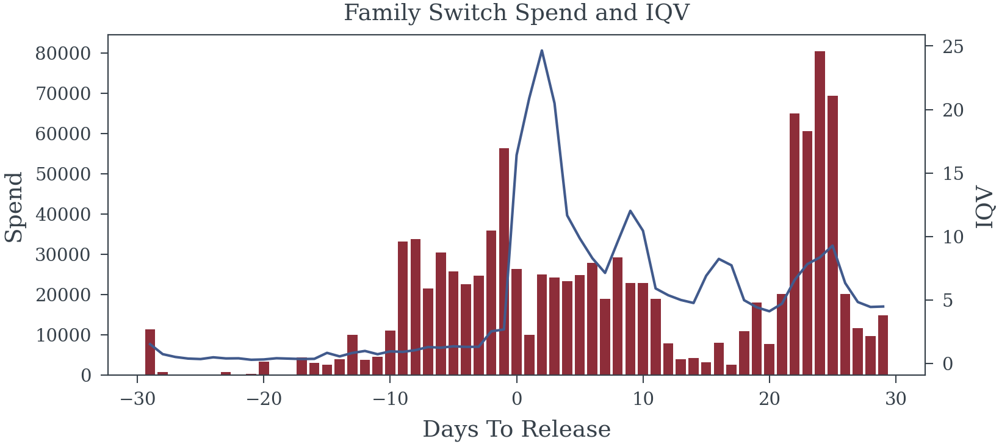

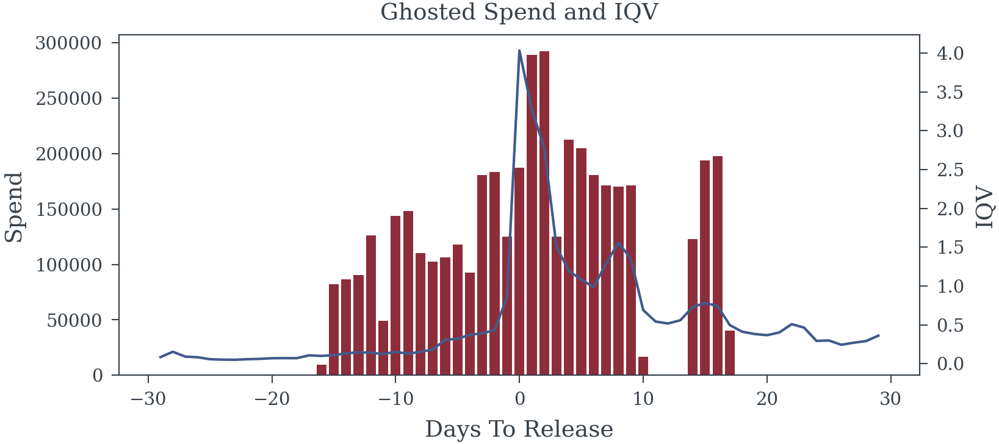

...

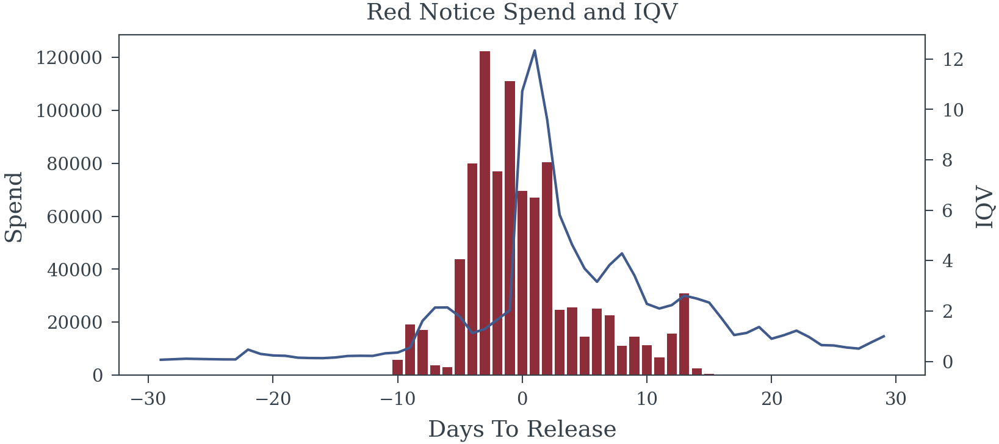

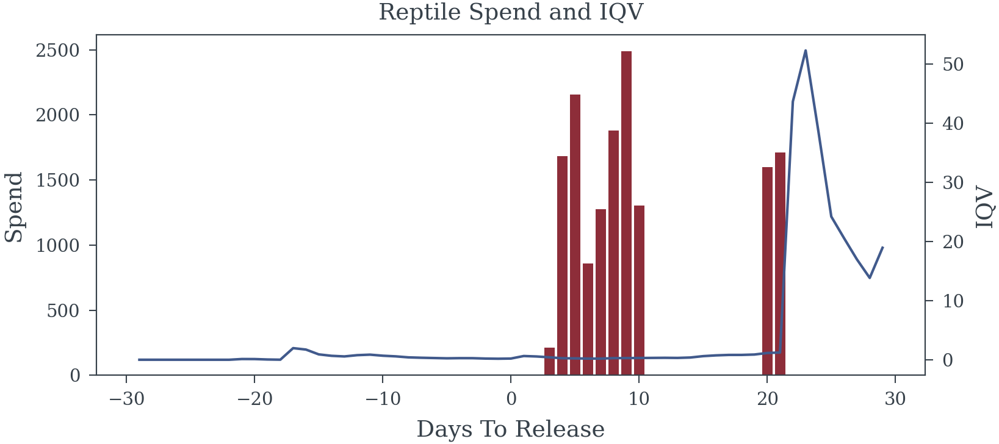

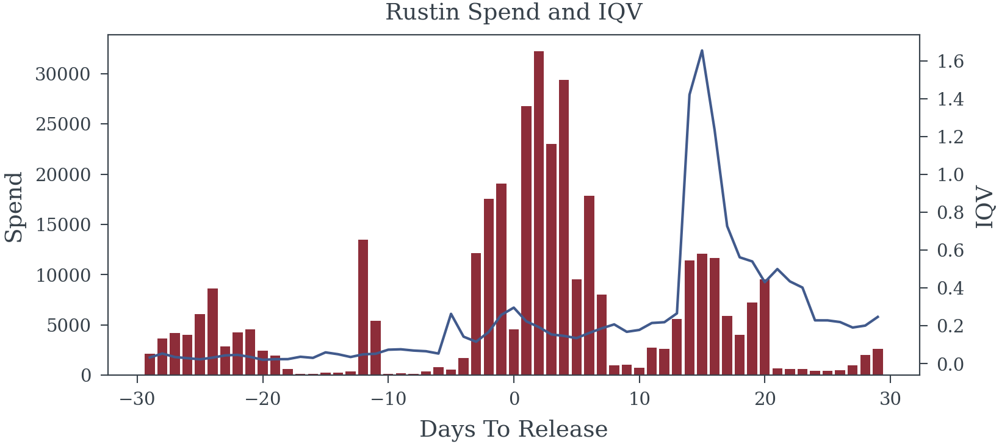

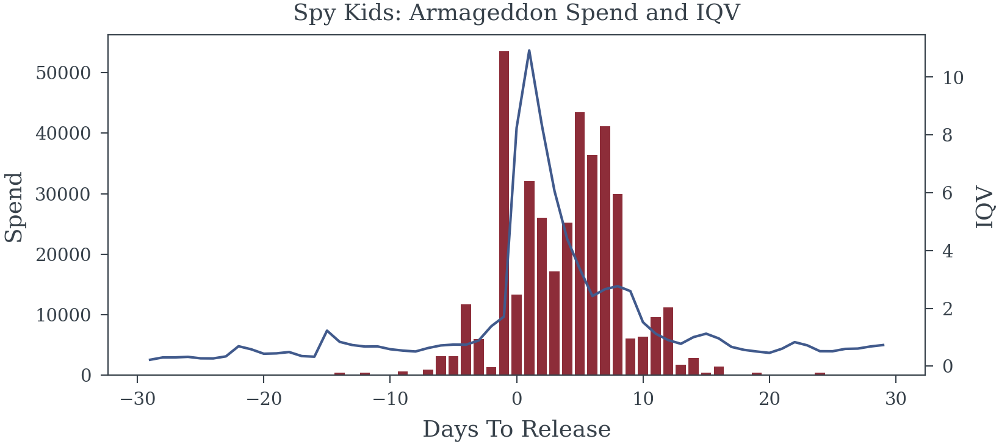

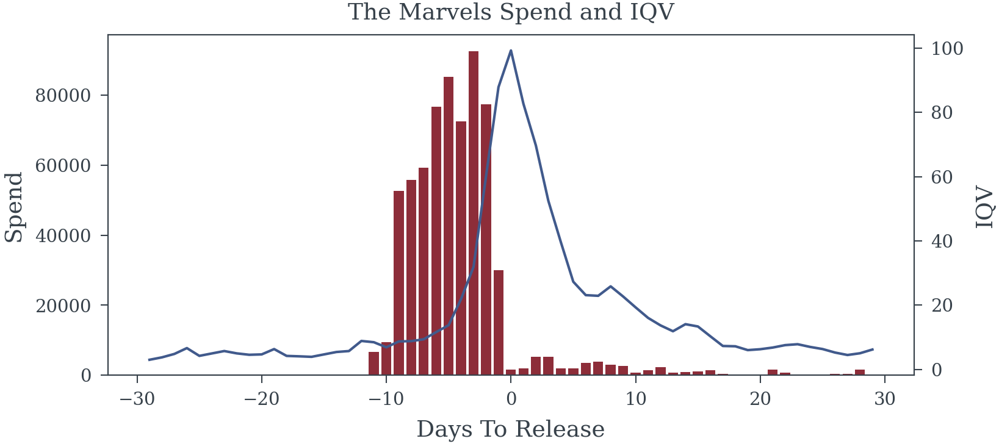

In [23]:
for movie in MOVIES:
    MOVIE_EXAMPLE = movie
    movie_df = cleaned_inputs.query("title==@MOVIE_EXAMPLE").query("days_to_release>-30 & days_to_release<30").sort_values("days_to_release")
    fig, ax = plt.subplots()
    ax.bar(movie_df['days_to_release'], movie_df['spend'])
    ax.set_ylabel("Spend")
    axt = ax.twinx()
    axt.plot(movie_df.query("media_channel=='Social'")['days_to_release'], movie_df.query("media_channel=='Social'")['iqv'], c=rgb.tue_darkblue)
    axt.set_ylabel("IQV")
    ax.set_xlabel("Days To Release")
    ax.set_title(f"{MOVIE_EXAMPLE} Spend and IQV")
    #fig.show()

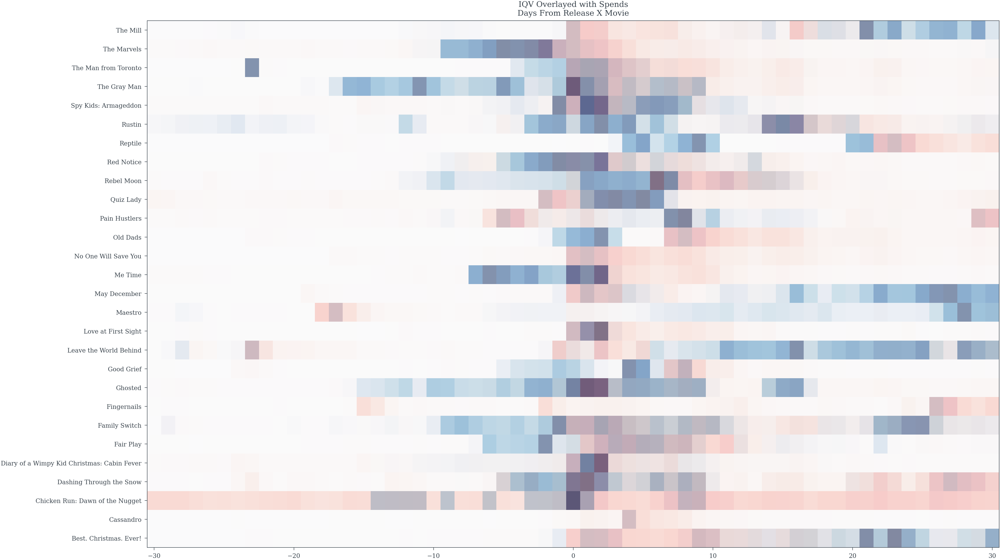

In [24]:
iqv = normalized_inputs.query("media_channel == 'Social'").query("days_to_release < 31 & days_to_release > -31")
spends = normalized_inputs.query("days_to_release < 31 & days_to_release > -31").groupby(['days_to_release', 'title'])[['spend']].sum().reset_index()

iqv = iqv.merge(iqv.groupby("title")[['iqv']].max().reset_index().rename(columns={'iqv':'max_iqv'}), right_on=['title'], left_on=['title'])
iqv['normed_iqv'] = iqv['iqv']/iqv['max_iqv']

spends = spends.merge(spends.groupby("title")[['spend']].agg(lambda x: x.max() if x.max()>0 else 1).reset_index().rename(columns={'spend': 'max_spend'}), right_on=['title'], left_on=['title'])
spends['normed_spend'] = spends['spend']/spends['max_spend']

iqv_mesh = iqv.pivot_table(values=['normed_iqv'], index='days_to_release', columns='title')
unnormed_iqv_mesh = iqv.pivot_table(values=['iqv'], index='days_to_release', columns='title')
spends_mesh = spends.pivot_table(values=['normed_spend'], index='days_to_release', columns='title')

#XX, YY = np.meshgrid(iqv_mesh.index.values, iqv_mesh.columns.get_level_values(1).values)
plt.figure(figsize=(16,9))
plt.pcolormesh(iqv_mesh.index.values, iqv_mesh.columns.get_level_values(1).values, iqv_mesh.T, cmap='Reds', alpha=.5)
plt.title("IQV Overlayed with Spends\nDays From Release X Movie")
plt.pcolormesh(spends_mesh.index.values, spends_mesh.columns.get_level_values(1).values, spends_mesh.T, cmap='Blues', alpha=.5)
#plt.scatter(iqv['days_to_release'], iqv['title'], c=iqv['iqv']/iqv['max_iqv'], s=4, alpha=.8)

Text(0.5, 1.0, 'IQV')

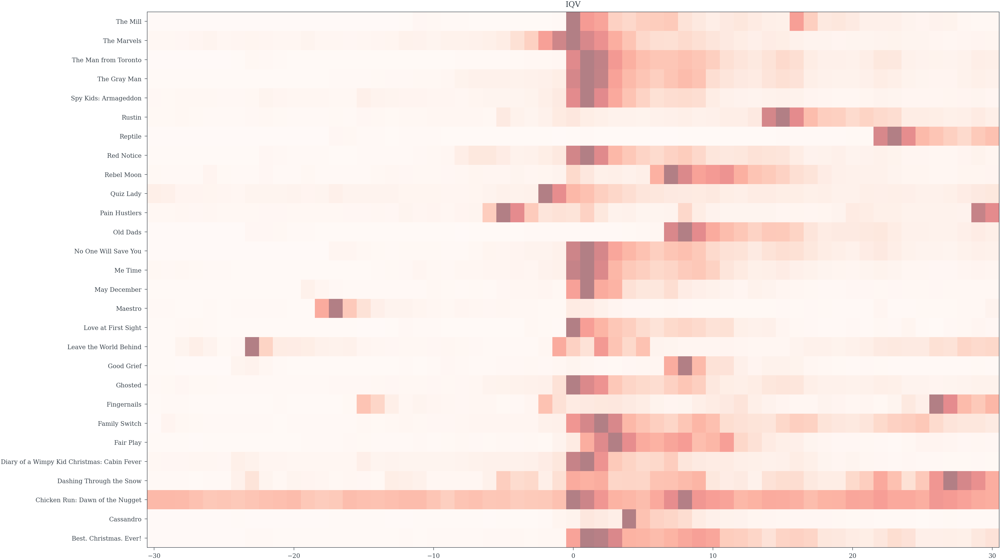

In [25]:
plt.figure(figsize=(16,9))
plt.pcolormesh(iqv_mesh.index.values, iqv_mesh.columns.get_level_values(1).values, iqv_mesh.T, cmap='Reds', alpha=.5)
plt.title("IQV")

Text(0.5, 1.0, 'Total Spends')

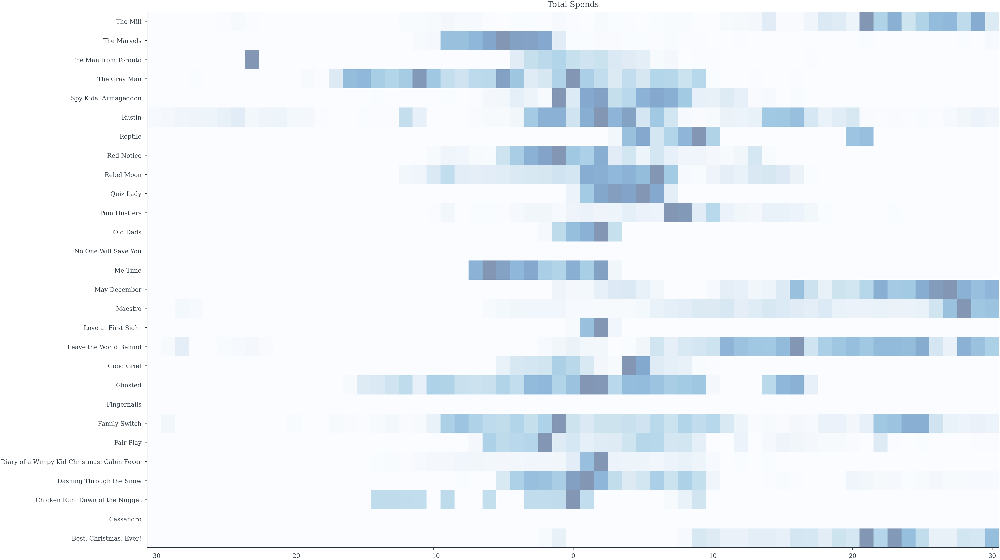

In [26]:
plt.figure(figsize=(16,9))
plt.pcolormesh(spends_mesh.index.values, spends_mesh.columns.get_level_values(1).values, spends_mesh.T, cmap='Blues', alpha=.5)
plt.title("Total Spends")

In [27]:
unnormed_iqv_mesh["iqv"][MOVIES].values.shape

(61, 21)

In [28]:
from itertools import product

In [29]:
def make_cube(data, col='spend'):
    container = np.zeros((len(DAYS_TO_RELEASE), len(MOVIES), len(MEDIA_VARS)))
    for (t_i, t), (n_i, n), (m_i, m) in product(enumerate(DAYS_TO_RELEASE), enumerate(MOVIES), enumerate(MEDIA_VARS)):
        container[t_i, n_i, m_i] = data.query("days_to_release==@t").query("title==@n").query("media_channel==@m")[col].values[0]
    return container   

In [30]:
media_cube = make_cube(normalized_inputs[['days_to_release', 'title', 'media_channel', 'normalized_spend']], col='normalized_spend')

In [65]:
MEDIA_VARS

['Social', 'OLV', 'Display', 'OTT']

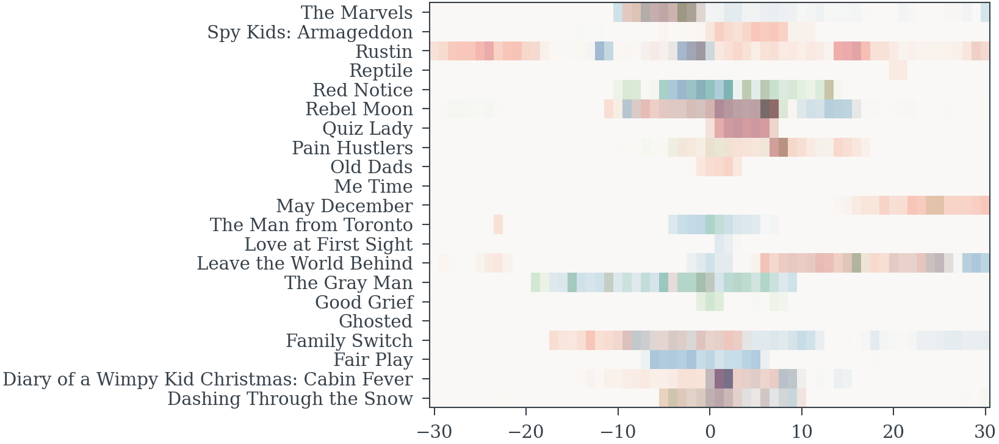

In [70]:
colors = ['Blues', "Reds", "Greens"]
alphas = [1, .5, .25]
for i, m in enumerate(MEDIA_VARS[1:]):
    plt.pcolormesh(spends_mesh.index.values, MOVIES, np.log(media_cube[:, :, i].T+1), cmap=colors[i], alpha=alphas[i])

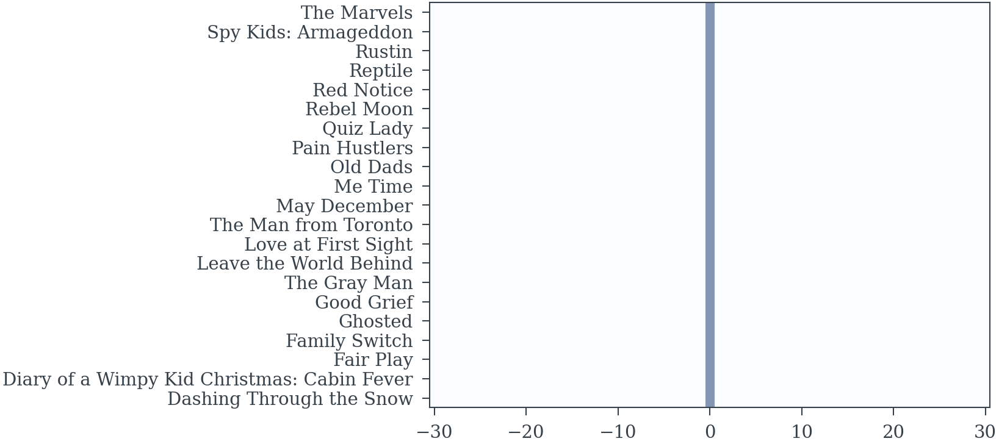

In [71]:
release_date_dummy = np.zeros((len(DAYS_TO_RELEASE), len(MOVIES)))
release_date_dummy[30, :] = 1
plt.pcolormesh(spends_mesh.index.values, MOVIES, release_date_dummy.T, cmap='Blues', alpha=.5)

In [72]:
from patsy import dmatrix

In [73]:
spends_mesh.index.values.astype(float)

array([-30., -29., -28., -27., -26., -25., -24., -23., -22., -21., -20.,
       -19., -18., -17., -16., -15., -14., -13., -12., -11., -10.,  -9.,
        -8.,  -7.,  -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,   1.,   2.,
         3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,  12.,  13.,
        14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,  24.,
        25.,  26.,  27.,  28.,  29.,  30.])

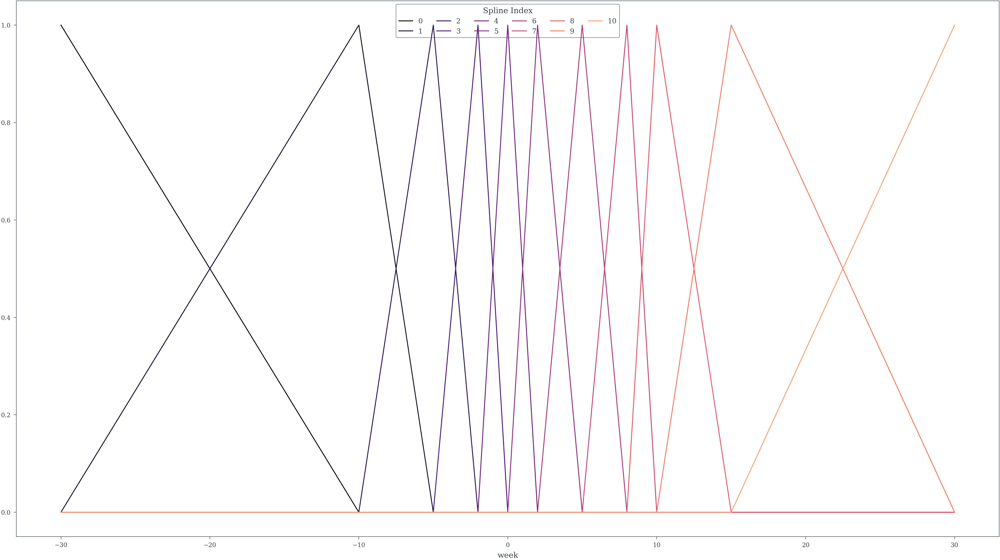

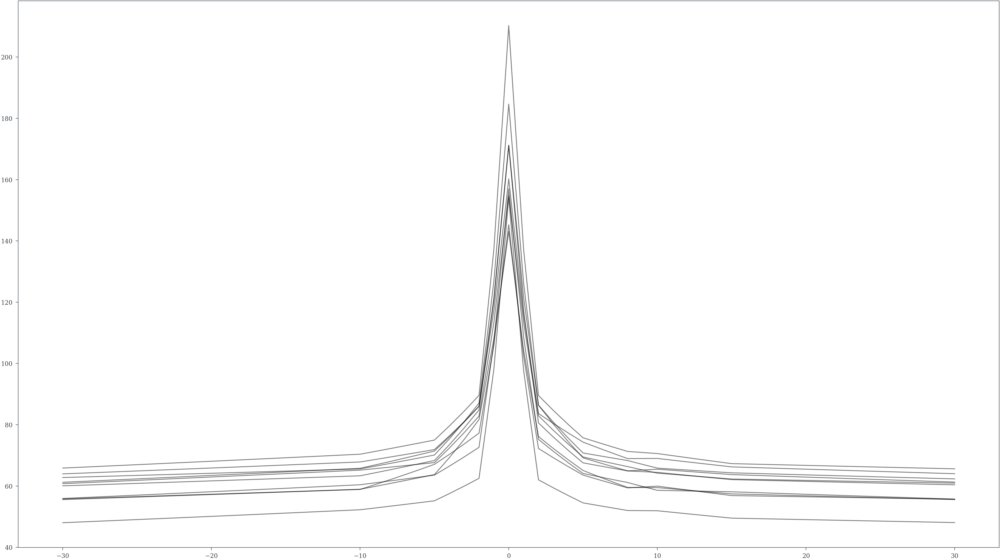

In [148]:
knots = [-30., -10, -5., -2, 0., 2, 5., 8, 10, 15., 30.]
B = dmatrix(
    "bs(days_to_release, knots=knots, degree=1, include_intercept=True) - 1",
     {"days_to_release": spends_mesh.index.values.astype(float), "knots": knots[1:-1]})

spline_df = (
    pd.DataFrame(B)
    .assign(week= spends_mesh.index.values.astype(float))
    .melt("week", var_name="spline_i", value_name="value")
)
color = plt.cm.magma(np.linspace(0, 0.80, len(spline_df.spline_i.unique())))
fig = plt.figure(figsize=(16, 9))
for i, c in enumerate(color):
    subset = spline_df.query(f"spline_i == {i}")
    subset.plot("week", "value", c=c, ax=plt.gca(), label=i)
plt.legend(title="Spline Index", loc="upper center", fontsize=8, ncol=6);
fig = plt.figure(figsize=(16, 9))
for i in range(10):
    betas = np.exp(np.random.normal(0, .1, size=B.shape[1]))/(np.abs(np.array(knots))+1)
    
    intercept = np.random.normal(4, .1)
    plt.plot(spends_mesh.index.values.astype(float), np.exp(np.asarray(B, order='F')@betas+ intercept), c='k', alpha=.5)

In [149]:
spline_container = np.zeros((B.shape[0], len(MOVIES), B.shape[1]))
for i in range(len(MOVIES)):
    spline_container[:, i, :] = np.asarray(B, order='F')

In [360]:
DAYS_TO_RELEASE = np.arange(61)-30

coords = {
    "media": MEDIA_VARS,
    "moive": MOVIES,
    "days_from_release": DAYS_TO_RELEASE,
    "splines": np.arange(B.shape[1])
}

with pm.Model(coords=coords) as cubic_model:
  #load media data into model
  media_data_set = pm.Data("impressions", media_cube, dims=("days_from_release", 'movie', 'media'))
  search_iqv = pm.Data("search_iqv", unnormed_iqv_mesh["iqv"][MOVIES].values, dims=("days_from_release", 'movie'))
  
  
  #Prior on average effect of media across campaigns and outlets for impressions
  betas_media_ave = pm.Normal("betas_media_mu_log", np.log(.05), 2, dims=("media"), initval=np.array([-3]*len(MEDIA_VARS)))
  #Prior on expected deviation between outlets and campaigns
  betas_media_reg = pm.HalfNormal("betas_media_sigma", .1, dims=("media"), initval=np.array([.01]*len(MEDIA_VARS)))
  #Prior on individual media effects strictly positive
  betas_media_specific = pm.Deterministic("betas_media_log", 
      pm.Normal(
      'betas_media_log_', 
      mu=0, 
      sigma=1,
      dims=('movie', 'media')
      )*betas_media_reg[None, :] + betas_media_ave[None, :], dims=('movie', 'media'))


  #Priors on shape prameters
  #K_m = pm.Uniform("K_m", .5, 7, dims=("media"))
  K_m = pm.Normal("K_m", mu=np.log(6), sigma=2, dims=("media"))
  k_sigma = pm.HalfNormal("K_sig", .5, dims=("media"))
  K_n = pm.Deterministic(
    "K_n", 
    K_m[None, :] + pm.Normal("K_n_", 0, 1, dims=("movie", 'media'))*k_sigma[None, :],
    dims=("movie", "media")
    )
    
  n_m = pm.Exponential("n_m", 1, dims="media")+.95
  #n = pm.TruncatedNormal(
  #  "n", 
  #  mu=n_m, 
  #  sigma=.01, lower=.8, upper=3, 
  #  dims=("outlet", "campaign", "media")
  #  )
    
  #Priors on decay parameters
  lam = pm.Normal("lam", np.log(6), .5, dims="media")
  lam_sigma = pm.HalfNormal("lam_sig", 3, dims="media")
  lam_n = pm.Deterministic(
    "lam_n", 
    lam[None, :] + pm.Normal("lam_n_", 0, 1, dims=("movie", "media"))*lam_sigma[None, :],
    dims=("movie", "media")
    )
  theta = pm.Normal("theta", np.log(8), 2, dims="media")
  theta_sigma = pm.HalfNormal("theta_sig", 3, dims='media')
  theta_n = pm.Deterministic(
    "theta_n",
    theta[None, :] + pm.Normal("theta_n_", 0, 1, dims=("movie", "media"))*theta_sigma[None, :],
    dims=("movie", 'media')
  )


  media_effect = pm.Deterministic("media_effect", pm.math.exp(betas_media_specific) * adstock.weibull_adstock(
      shape.hill_function(media_data_set, n_m, pm.math.exp(K_n)), 
      pm.math.exp(lam_n), pm.math.exp(theta_n), l_max=20
      ), 
      dims=("days_from_release", "movie", "media"))
    
  total_media_effect = pm.Deterministic("total_media_effect", media_effect.sum(axis=-1), dims=("days_from_release", "movie"))
  #tau = pm.Normal("tau", -4, sigma=2)
  #tau_sigma = pm.HalfNormal("tau_sigma", np.log(1.4))
  #tau_t = pm.Normal("tau_t", tau, sigma=tau_sigma, dims=("days_from_release"))
  spline_betas = pm.Normal("spline_betas", -(np.abs(np.array(knots))/10)+2, sigma=.1, dims='splines')
  spline_sigma = pm.HalfNormal("splines_sigma", 1, dims='splines')

  spline_betas_n = pm.Normal("splines_betas_n", spline_betas, spline_sigma, dims=("movie", "splines"))
  tau_t = pm.Deterministic('tau_t', pm.math.sum(spline_container[:, :, :] * (spline_betas_n[None, :, :]), axis=-1), dims=("days_from_release", "movie"))
  #release_date_effect = pm.Normal('release_date', 0, 1)

  u = pm.Normal("u", -4, sigma=2)
  u_sigma = pm.HalfNormal('u_sigma', 3)
  u_n = pm.Normal("u_n", u, sigma=u_sigma, dims=("movie"))
    #impressions_mu = 
  sigma = pm.HalfNormal('sigma', .1)
  total_effect = pm.Deterministic("total_effect", (total_media_effect + tau_t + u_n), dims=("days_from_release", "movie"))
  impressions_sample = pm.LogNormal('iqv_obs', mu=total_effect, sigma=sigma, observed=search_iqv, dims=("days_from_release", "movie"))
  #sales_m = pm.Normal("sales", mu, sigma, observed=np.log(sales))
  #trace = pm.sample(2000, tune=2000, nuts_sampler='numpyro')

In [361]:
#Load model
import arviz as az

In [362]:
#trace = az.from_netcdf("linspline.nc")

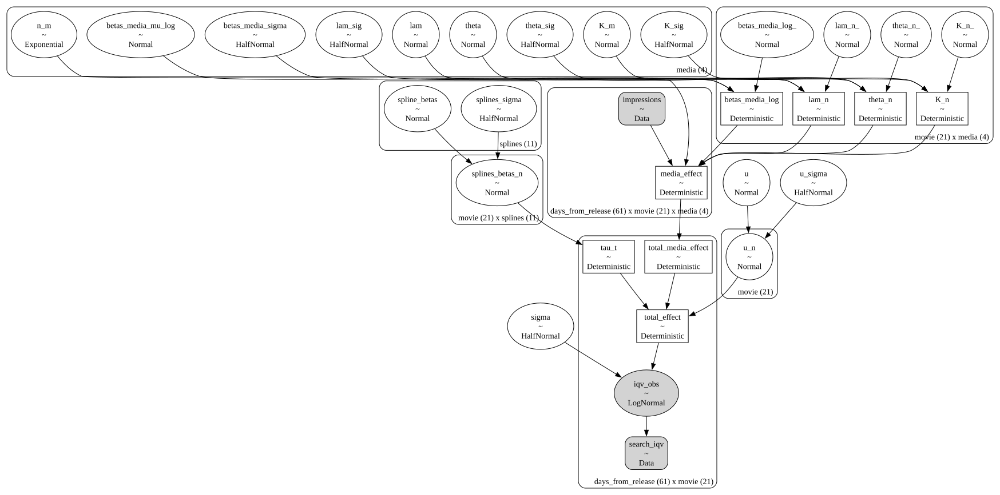

In [363]:
pm.model_to_graphviz(cubic_model)

In [350]:
with cubic_model:
    prior_predictive = pm.sample_prior_predictive(1000)

Sampling: [K_m, K_n_, K_sig, betas_media_log_, betas_media_mu_log, betas_media_sigma, iqv_obs, lam, lam_n_, n_m, sigma, spline_betas, splines_betas_n, splines_sigma, theta, theta_n_, u, u_n, u_sigma]


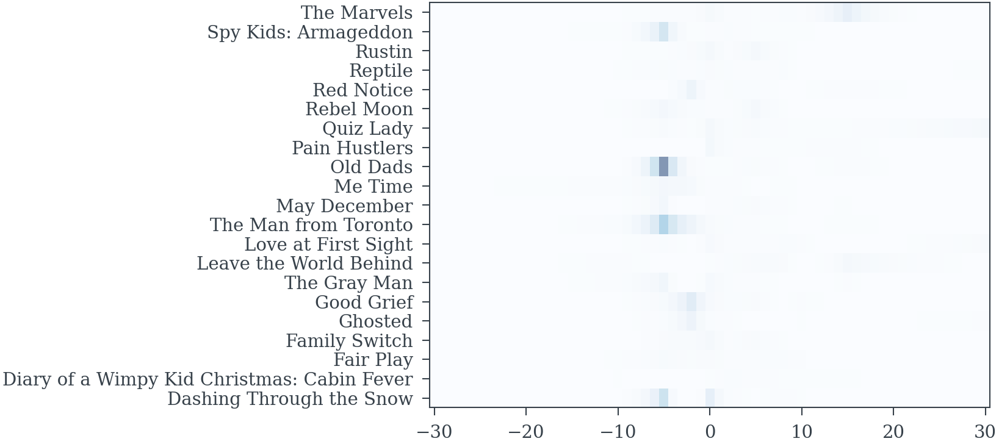

In [351]:

plt.pcolormesh(spends_mesh.index.values, MOVIES,np.exp(pm.draw(tau_t)).T, cmap='Blues', alpha=.5)

In [352]:
prior_predictive.prior_predictive.mean(dim=('chain', 'draw'))

<xarray.Dataset> Size: 11kB
Dimensions:            (days_from_release: 61, movie: 21)
Coordinates:
  * days_from_release  (days_from_release) int32 244B -30 -29 -28 ... 28 29 30
  * movie              (movie) int32 84B 0 1 2 3 4 5 6 ... 14 15 16 17 18 19 20
Data variables:
    iqv_obs            (days_from_release, movie) float64 10kB 13.14 ... 26.98

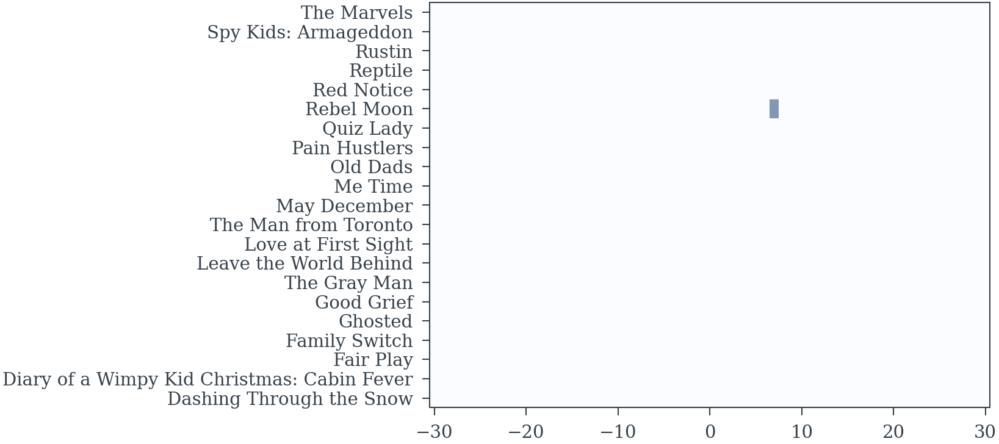

In [353]:
plt.pcolormesh(spends_mesh.index.values, MOVIES, prior_predictive.prior_predictive.mean(dim=('chain', 'draw')).to_dataarray()[0].T, cmap='Blues', alpha=.5)

In [364]:
with cubic_model:
    map_est = pm.find_MAP()

d:\MattReda\miniforge\envs\pv_pitch_work\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

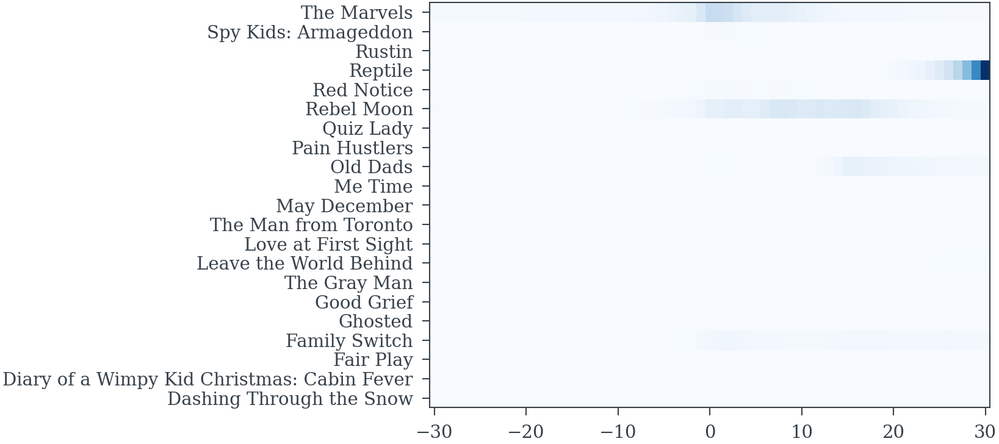

In [365]:
plt.pcolormesh(spends_mesh.index.values, MOVIES, np.exp(map_est['total_effect']).T , cmap='Blues')

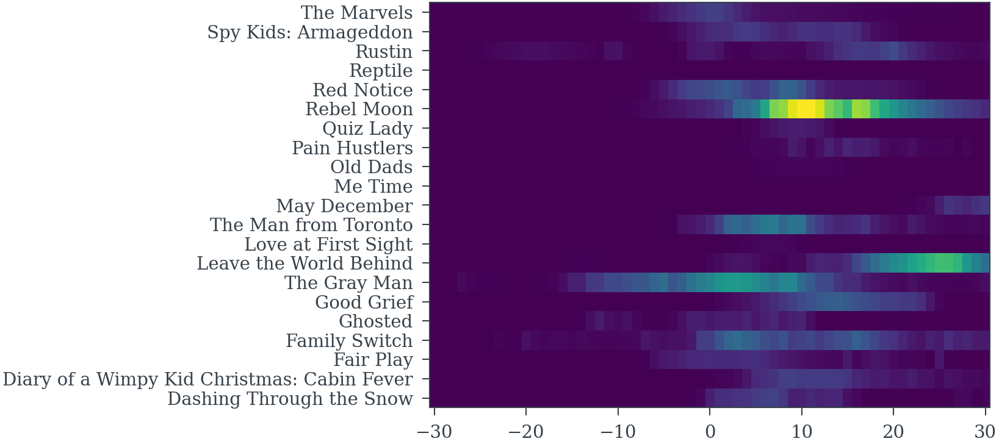

In [366]:
plt.pcolormesh(spends_mesh.index.values, MOVIES, np.exp(map_est['total_media_effect'].T))

In [371]:
np.exp(map_est['lam_n'])

array([[ 6.90315624,  6.82244049,  5.70885957,  6.42290157],
       [ 6.95187113,  4.85512612,  6.2743183 , 33.57642417],
       [15.15626387,  6.45216903,  6.2743183 ,  4.34332347],
       [10.48395211,  5.0476455 ,  6.2743183 ,  5.77387217],
       [ 6.34082157,  6.44652295,  6.27551992,  2.31200362],
       [ 6.34082157,  6.44652295, 11.36052413, 17.63477301],
       [ 6.85381091,  6.2551038 ,  7.01864425, 16.64584772],
       [ 4.46209432, 11.70083501,  9.40980551, 80.88857179],
       [ 6.8980609 ,  6.44652295,  6.2743183 ,  8.43522563],
       [ 8.88260762,  6.15954624,  7.63038608,  9.83366926],
       [ 6.34082157,  6.69307316,  6.07695799,  6.66777386],
       [ 6.34082157,  6.44652295,  6.2743183 ,  8.43522563],
       [ 6.34082157, 11.32855892,  6.2743183 ,  8.43522563],
       [ 6.34082157, 11.34261615,  6.90864156,  6.14793341],
       [ 6.22787136,  7.66551833,  6.2743183 ,  8.43522563],
       [15.06758944,  4.85242476,  4.30353643, 12.33423005],
       [ 3.44630772,  6.

In [370]:
np.exp(map_est['theta_n'])

array([[ 5.18526648,  7.46074132,  5.20715874, 55.10284286],
       [ 4.37693491,  6.2876112 ,  4.86561989, 26.28984249],
       [ 0.64773985,  6.07097706,  4.86561989, 13.06838451],
       [ 4.85867806,  8.17410349,  4.86561989,  0.21682631],
       [ 4.16134733,  6.06968653,  4.86545572,  3.71758602],
       [ 4.16134733,  6.06968653,  3.33336597,  3.83821644],
       [ 4.09687133,  5.79404012,  2.7169094 ,  0.19622306],
       [ 3.40000704,  4.23545844,  3.98071732,  0.66781752],
       [ 3.80682695,  6.06968653,  4.86561989,  3.37353133],
       [ 1.68773165,  6.12207225,  3.54821551,  0.10457855],
       [ 4.16134733,  5.80406762,  4.82640346, 10.0103647 ],
       [ 4.16134733,  6.06968653,  4.86561989,  3.37353133],
       [ 4.16134733,  3.71549056,  4.86561989,  3.37353133],
       [ 4.16134733, 12.82166548,  6.54010152, 48.89451376],
       [ 4.41078541, 10.51651048,  4.86561989,  3.37353133],
       [ 2.59247865,  0.74101785,  1.65317495,  0.66085385],
       [ 2.9352136 ,  6.

In [387]:
LIKE_MOVIES = [
    "Red Notice",
    "Ghosted",
    "The Gray Man",
    "The Man from Toronto",
    "Me Time"
]

In [389]:
LIKE_MOVIES_IND = [MOVIES.index(movie) for movie in LIKE_MOVIES]

In [391]:
MAE = np.mean(np.abs(unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values-np.exp(map_est['total_effect'][:, LIKE_MOVIES_IND])))
MAE

0.20931009246543644

In [395]:
MAPE = np.mean(np.abs(unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values-np.exp(map_est['total_effect'][:, LIKE_MOVIES_IND]))/unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values)
MAPE

0.39649687422398366

In [392]:
res_ss = np.sum((unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values-np.exp(map_est['total_effect'][:, LIKE_MOVIES_IND]))**2)

In [393]:
tot_ss = np.sum((unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values-np.mean(unnormed_iqv_mesh['iqv'][LIKE_MOVIES].values))**2)

In [394]:
1 - res_ss/tot_ss

0.7799339967424957

In [405]:
np.exp(map_est["betas_media_log"][LIKE_MOVIES_IND, :]).mean(axis=0)

array([0.1589168 , 0.07334537, 0.09625622, 0.27003257])

In [406]:
MEDIA_VARS

['Social', 'OLV', 'Display', 'OTT']

In [409]:
np.exp(map_est["K_n"][LIKE_MOVIES_IND, :]).mean(axis=0)

array([1.41383901, 3.27344826, 3.2827705 , 1.0798364 ])

In [412]:
map_est['n_m']+.95

array([1.34534015, 1.4514198 , 1.52340097, 1.43122208])

In [414]:
np.exp(map_est['lam_n'][LIKE_MOVIES_IND, :]).mean(axis=0)

array([1.80804402, 1.85139306, 1.97443632, 1.91294191])

In [416]:
np.exp(map_est['theta_n'][LIKE_MOVIES_IND, :]).mean(axis=0)

array([3.40850225, 6.03311337, 4.04508019, 2.01733346])

In [18]:
import pytensor.tensor as pt
t = pt.arange(15)+1
lam = [1.80804402, 1.85139306, 1.97443632, 1.91294191][0]
k = [3.40850225, 6.03311337, 4.04508019, 2.01733346][0]
w = pt.exp(pm.Weibull.logp(t, k, lam))
w = (w - pt.min(w, axis=-1)[..., None]) / (
pt.max(w, axis=-1)[..., None] - pt.min(w, axis=-1)[..., None]
)
w.eval()

array([6.75833768e-001, 1.00000000e+000, 3.95245798e-002, 6.81011140e-006,
       4.51412650e-013, 7.15658732e-025, 1.28736853e-042, 9.89783440e-068,
       9.97506706e-102, 3.35016640e-146, 8.01305266e-203, 2.47946471e-273,
       0.00000000e+000, 0.00000000e+000, 0.00000000e+000])

In [420]:
np.exp(map_est['u_n'])[LIKE_MOVIES_IND].mean()

0.16706783659618835

In [423]:
np.exp(map_est['tau_t'] + map_est['u_n'][None, :])[:, LIKE_MOVIES_IND].mean(axis=1)

array([0.03735587, 0.03804052, 0.03880195, 0.03964546, 0.0405768 ,
       0.0416022 , 0.04272838, 0.04396262, 0.0453128 , 0.04678743,
       0.04839574, 0.05014766, 0.05205397, 0.05412631, 0.05637725,
       0.05882038, 0.06147039, 0.06434315, 0.06745582, 0.07082693,
       0.07447649, 0.09893218, 0.13196934, 0.17686961, 0.23829448,
       0.3229187 , 0.37637501, 0.43868054, 0.5113002 , 0.80319435,
       1.26172681, 1.22747646, 1.19415587, 1.02552008, 0.88069862,
       0.7563285 , 0.77274835, 0.78952466, 0.8066652 , 0.68172706,
       0.57613962, 0.53690673, 0.501411  , 0.46935795, 0.44048451,
       0.4145564 , 0.39810716, 0.3823991 , 0.36739708, 0.35306769,
       0.33937914, 0.3263012 , 0.31380508, 0.30186343, 0.2904502 ,
       0.2795406 , 0.26911105, 0.25913912, 0.24960344, 0.2404837 ,
       0.23176054])

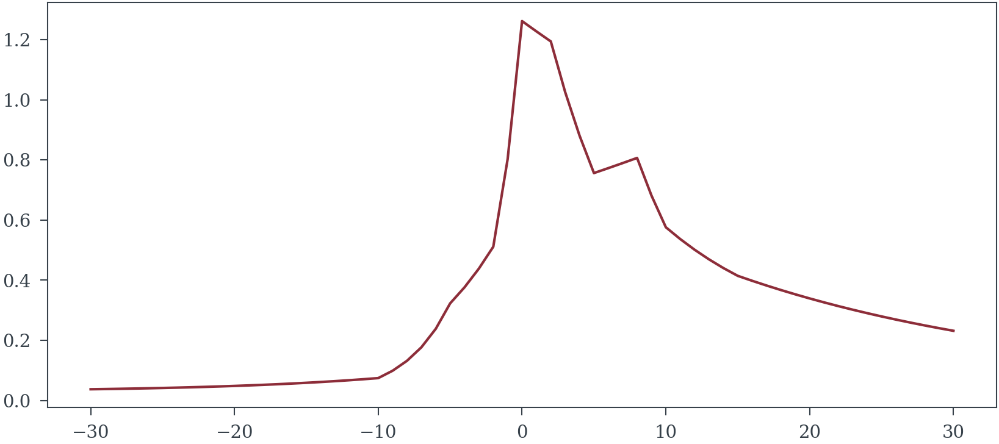

In [424]:
plt.plot(spends_mesh.index.values, np.exp(map_est['tau_t'] + map_est['u_n'][None, :])[:, LIKE_MOVIES_IND].mean(axis=1))

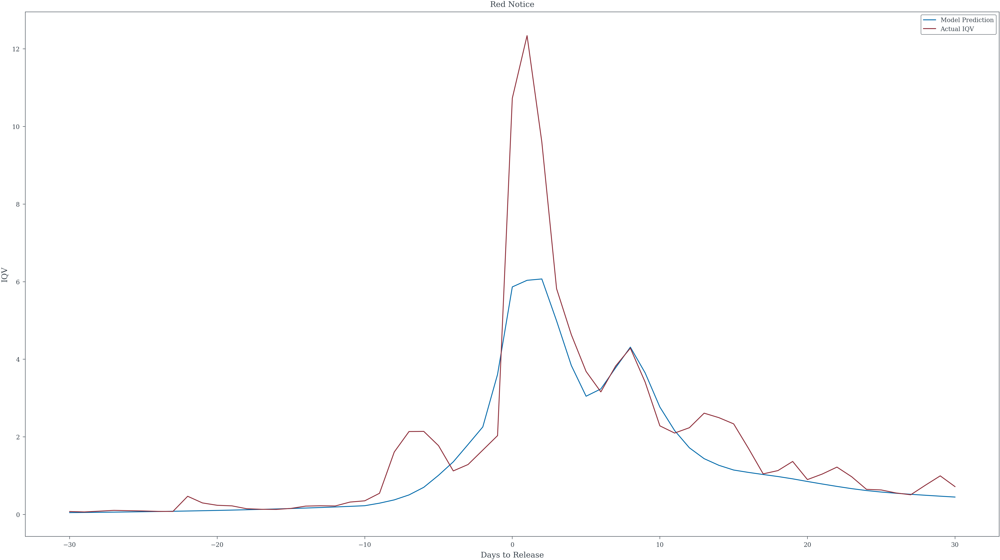

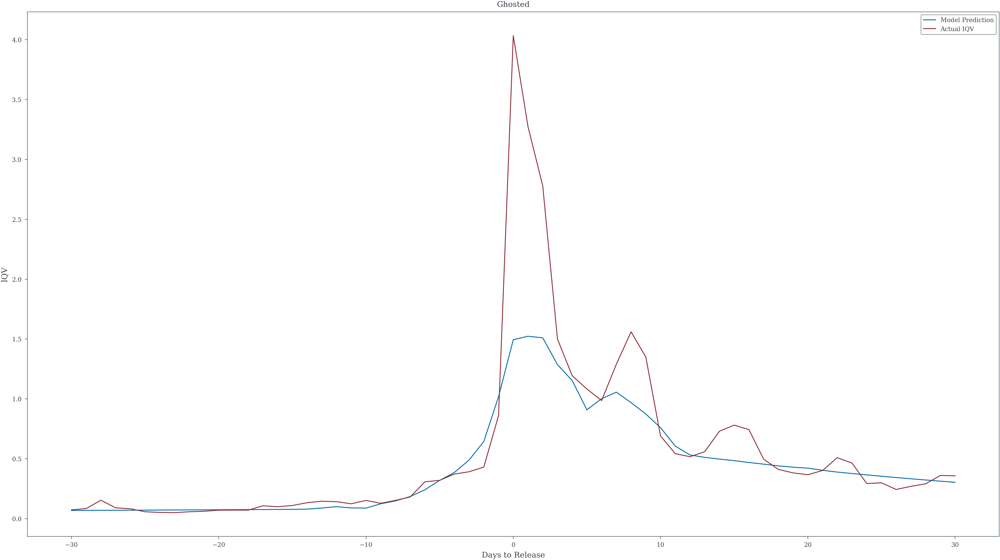

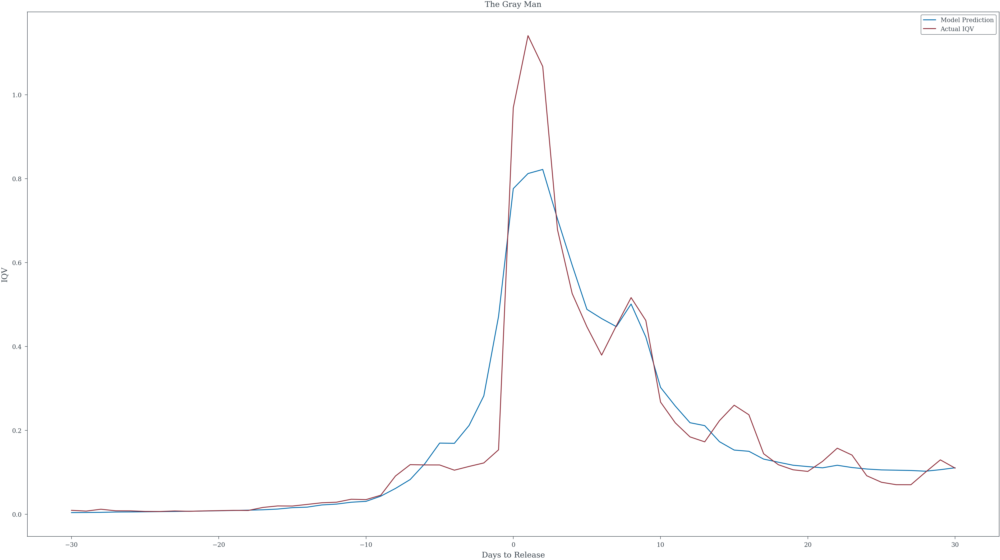

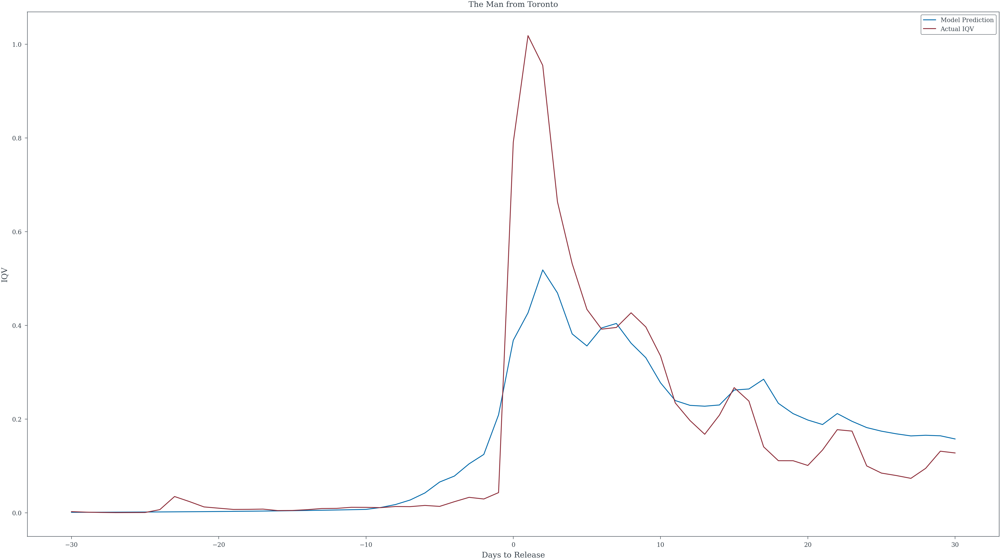

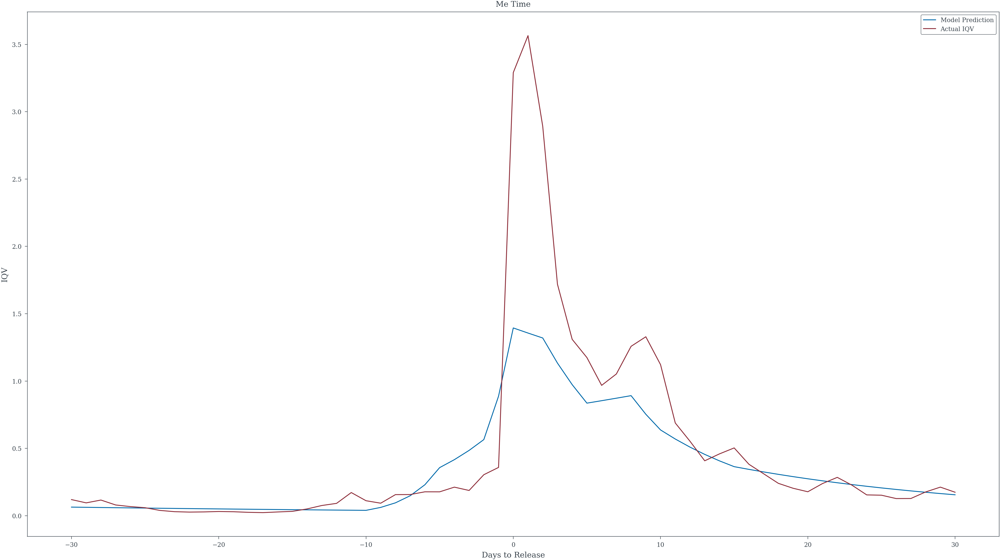

In [397]:
for i, movie in zip(LIKE_MOVIES_IND, LIKE_MOVIES):
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.plot(spends_mesh.index.values, np.exp(map_est['total_effect']).T[i,:], color=rgb.tue_blue, label='Model Prediction')
    #axt = ax.twinx()
    
    #axt.plot(spends_mesh.index.values, np.exp(map_est['total_media_effect']).T[i, :], color=rgb.tue_green, label='Estimated Media Effect')
    #axtt = axt.twinx()
    #axtt.bar(spends_mesh.index.values, spends_mesh['normed_spend'][MOVIES[i]], alpha=.2)
    ax.plot(spends_mesh.index.values, unnormed_iqv_mesh['iqv'][MOVIES].values.T[i, :], color=rgb.tue_red, label='Actual IQV')
    ax.set_title(movie)
    ax.set_ylabel("IQV")
    axt.set_ylabel("Media Multiplier")
    ax.set_xlabel("Days to Release")
    ax.legend()

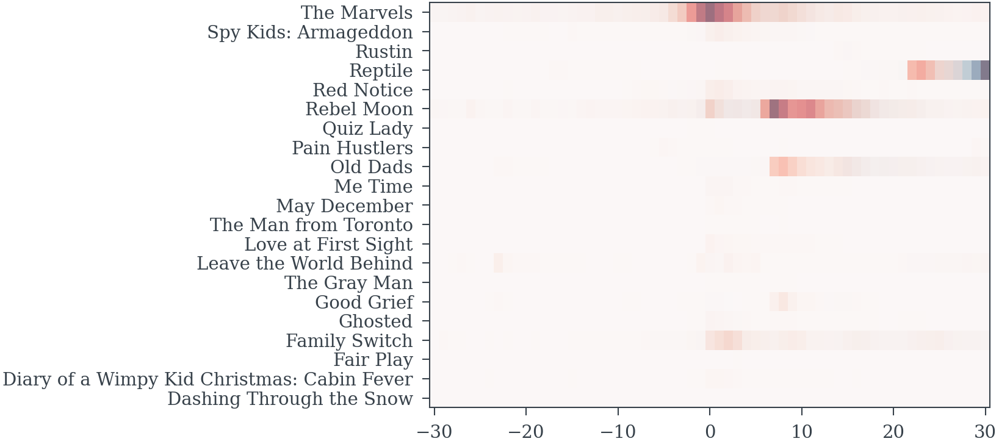

In [398]:
plt.pcolormesh(spends_mesh.index.values, MOVIES, np.exp(map_est['total_effect']).T , cmap='Blues', alpha=1)
plt.pcolormesh(spends_mesh.index.values, MOVIES, unnormed_iqv_mesh["iqv"][MOVIES].values.T, cmap='Reds', alpha=.5)

In [372]:
map_est_json = map_est.copy()
for key in map_est:
    map_est_json[key] = map_est_json[key].tolist()

In [373]:
import json
with open("map_est_best.json", 'w') as f:
    json.dump(map_est_json, f)

In [56]:
with cubic_model:
    trace = pm.sample(1000, target_accept=.99, nuts_sampler='numpyro')

Compiling.. :   0%|          | 0/2000 [00:00<?, ?it/s]





Running chain 0:   0%|          | 0/2000 [00:14<?, ?it/s]


Running chain 0: 100%|██████████| 2000/2000 [00:30<00:00, 583.11it/s]



























































Running chain 3: 100%|██████████| 2000/2000 [26:03<00:00,  1.28it/s]
There were 1191 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [88]:
trace

NameError: name 'trace' is not defined

In [57]:
trace.to_netcdf("weibul_adstock.nc")

'weibul_adstock.nc'

In [58]:
pm.summary(trace, var_names=['betas_media_mu_log'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
betas_media_mu_log[Social],-3.046,0.152,-3.261,-2.831,0.063,0.047,8.0,4.0,1.49
betas_media_mu_log[OLV],-3.100,0.212,-3.435,-2.839,0.097,0.074,7.0,4.0,1.53
betas_media_mu_log[Display],-2.958,0.091,-3.147,-2.782,0.001,0.001,4489.0,1680.0,1.52
betas_media_mu_log[OTT],-2.847,0.220,-3.111,-2.500,0.101,0.076,7.0,1971.0,1.53


array([[<Axes: title={'center': 'decay'}>,
        <Axes: title={'center': 'decay'}>]], dtype=object)

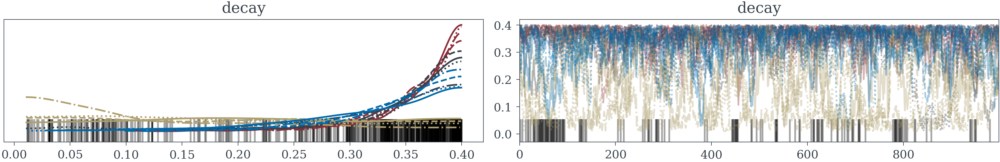

In [48]:
pm.plot_trace(trace, var_names=['decay'])

array([[<Axes: title={'center': 'delay\nSocial'}>,
        <Axes: title={'center': 'delay\nSocial'}>],
       [<Axes: title={'center': 'delay\nOLV'}>,
        <Axes: title={'center': 'delay\nOLV'}>],
       [<Axes: title={'center': 'delay\nDisplay'}>,
        <Axes: title={'center': 'delay\nDisplay'}>],
       [<Axes: title={'center': 'delay\nOTT'}>,
        <Axes: title={'center': 'delay\nOTT'}>]], dtype=object)

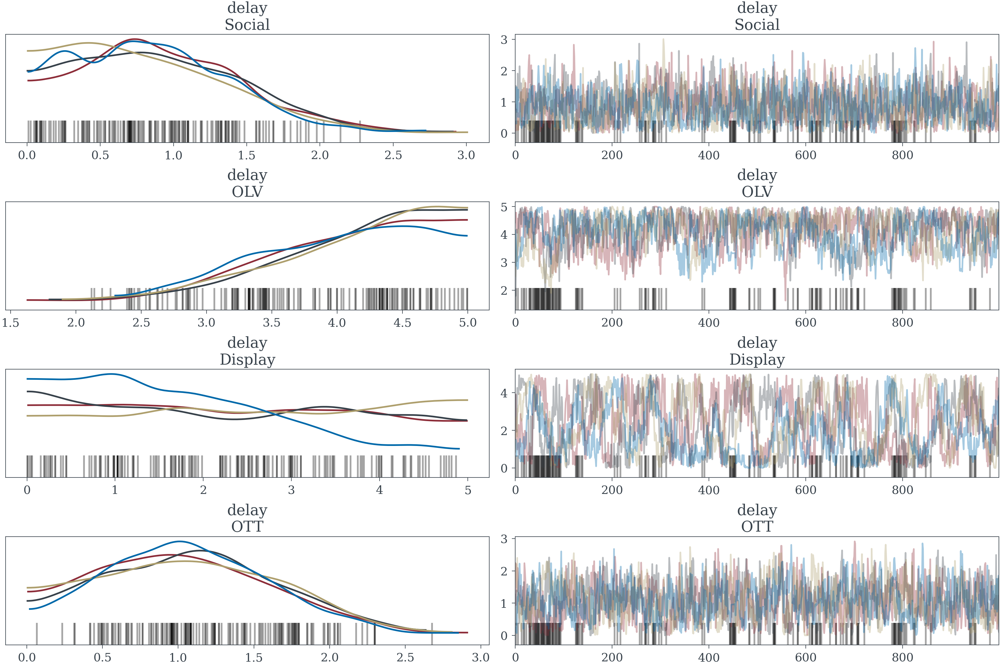

In [49]:
pm.plot_trace(trace, var_names=['delay'], compact=False)

array([[<Axes: title={'center': 'K_m\nSocial'}>,
        <Axes: title={'center': 'K_m\nSocial'}>],
       [<Axes: title={'center': 'K_m\nOLV'}>,
        <Axes: title={'center': 'K_m\nOLV'}>],
       [<Axes: title={'center': 'K_m\nDisplay'}>,
        <Axes: title={'center': 'K_m\nDisplay'}>],
       [<Axes: title={'center': 'K_m\nOTT'}>,
        <Axes: title={'center': 'K_m\nOTT'}>]], dtype=object)

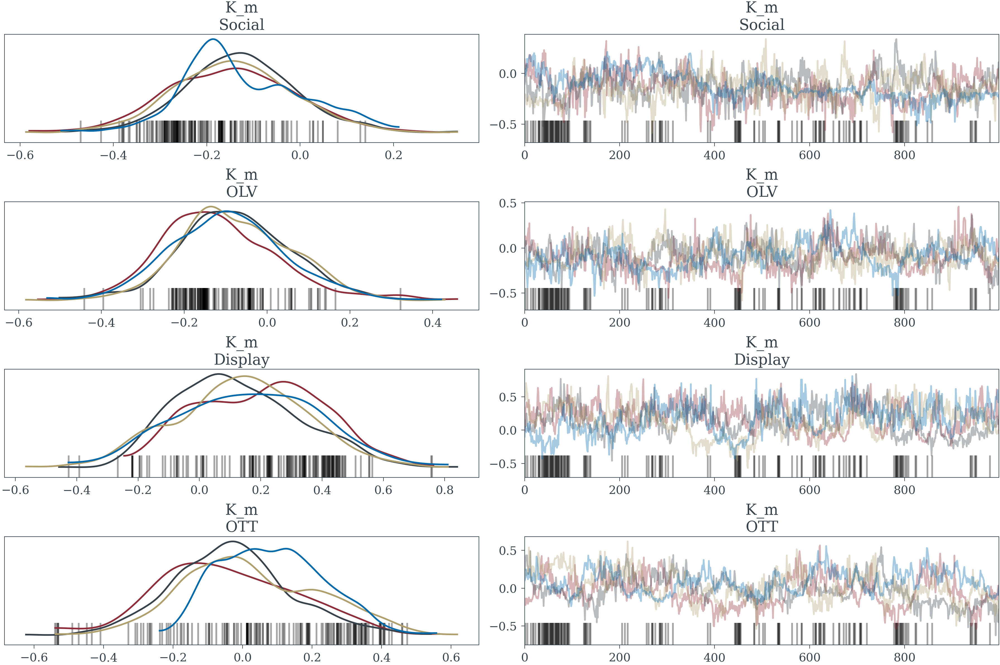

In [50]:
pm.plot_trace(trace, var_names=['K_m'], compact=False)

In [53]:
#pm.plot_trace(trace, var_names=['n'], compact=False)

In [54]:
#pm.plot_trace(trace, var_names=['tau_t'], compact=False)

In [55]:
pm.summary(trace, var_names=['tau_t'])

In [75]:
with cubic_model:
    posterior = pm.sample_posterior_predictive(trace)

Sampling: [iqv_obs]


d:\MattReda\miniforge\envs\pv_pitch_work\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

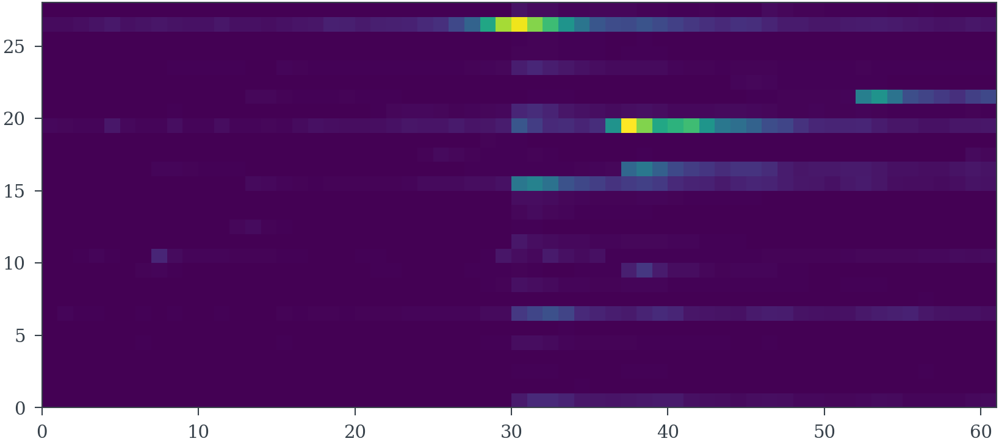

In [77]:
plt.pcolormesh(unnormed_iqv_mesh.values.T)

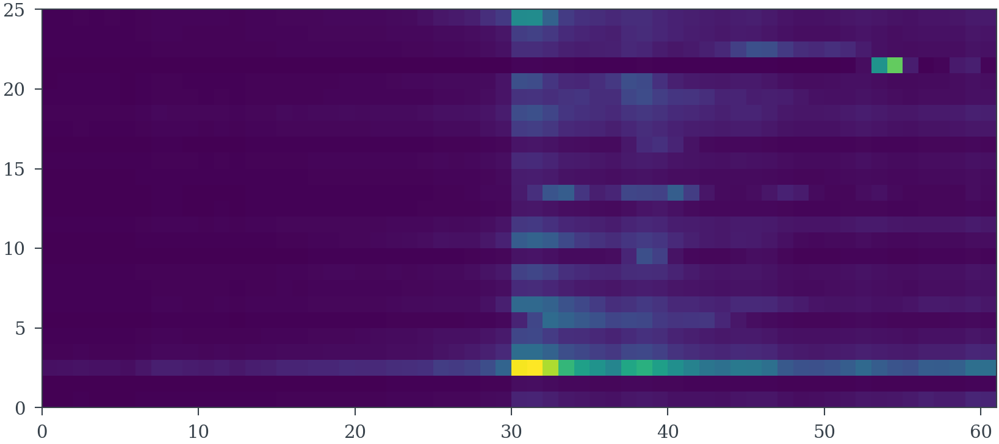

In [63]:
plt.pcolormesh(posterior.posterior_predictive.mean(dim=('chain', 'draw')).to_dataarray()[0].values.T)